In [ ]:
## Analysis of Mintflow signatures within scRNA-seq data of mouse subcutaneous tumours
## Data from following paper: https://aacrjournals.org/cancerimmunolres/article/doi/10.1158/2326-6066.CIR-24-1233/762988/In-vivo-labelling-resolves-distinct-temporal
## Dr Daniyal Jafree, Lotfollahi Group, CellGen Programme, Wellcome Sanger Institute
## Final Version - 20th July 2025

In [97]:
## Load up packages and set up environment

import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import numpy as np
import anndata as ad
import os
from IPython.paths import get_ipython_dir
from IPython.display import display

# Version check and set seed
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3
sc.settings.seed = 0

/tmp/ipykernel_3410181/4071309260.py:15: FutureWarning: Use `print_header` instead
  sc.logging.print_versions()


In [98]:
## Load and inspect the AnnData object for macrophages

adata_mac = sc.read_h5ad("/lustre/scratch126/cellgen/clatworthy/cl28/share/Daniyal/processed_Mac_tumour.h5ad")

# Create a new column in adata.obs
adata_mac.obs['photoconversion_status'] = adata_mac.obs['condition'].replace({
    'Isotype_Green': 'green',
    'anti-PDL1_Green': 'green',
    'Isotype_Red': 'red',
    'anti-PDL1_Red': 'red'
})

print(adata_mac)

AnnData object with n_obs × n_vars = 20900 × 19055
    obs: 'sample', 'treatment', 'colour', 'sort_group', 'scrublet_score', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'S_score', 'G2M_score', 'phase', 'condition', 'celltype_paper', 'photoconversion_status'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_pca', 'X_umap'


/tmp/ipykernel_3410181/2531892667.py:6: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata_mac.obs['photoconversion_status'] = adata_mac.obs['condition'].replace({


In [99]:
## Load and inspect the AnnData object for T cells

adata_cd8 = sc.read_h5ad("/lustre/scratch126/cellgen/clatworthy/cl28/share/Daniyal/processed_CD8T_tumour.h5ad")

# Create a new column in adata.obs
adata_cd8.obs['photoconversion_status'] = adata_cd8.obs['condition'].replace({
    'Green_Isotype': 'green',
    'Green_anti-PDL1': 'green',
    'Red_Isotype': 'red',
    'Red_anti-PDL1': 'red'
})

print(adata_cd8)

AnnData object with n_obs × n_vars = 16145 × 18399
    obs: 'sample', 'treatment', 'colour', 'sort_group', 'scrublet_score', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'S_score', 'G2M_score', 'phase', 'condition', 'seq_batch', 'celltype_cluster_fine', 'celltype_fine_latest', 'photoconversion_status'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'


/tmp/ipykernel_3410181/3054238769.py:6: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata_cd8.obs['photoconversion_status'] = adata_cd8.obs['condition'].replace({


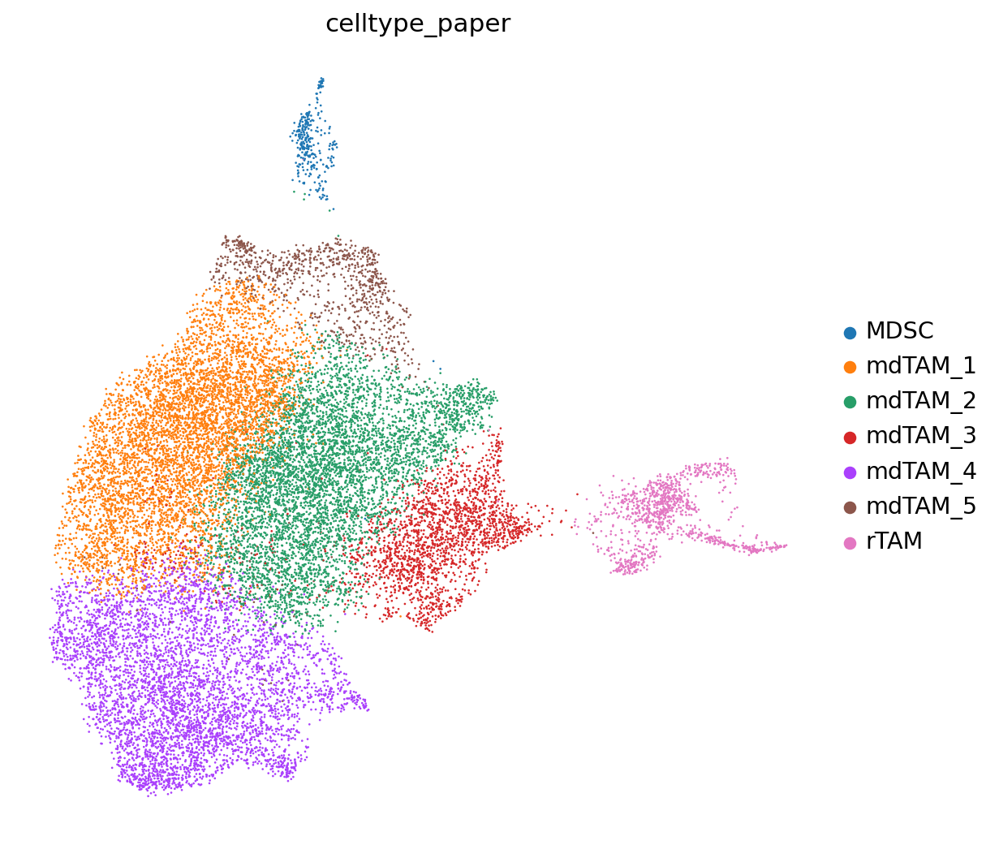

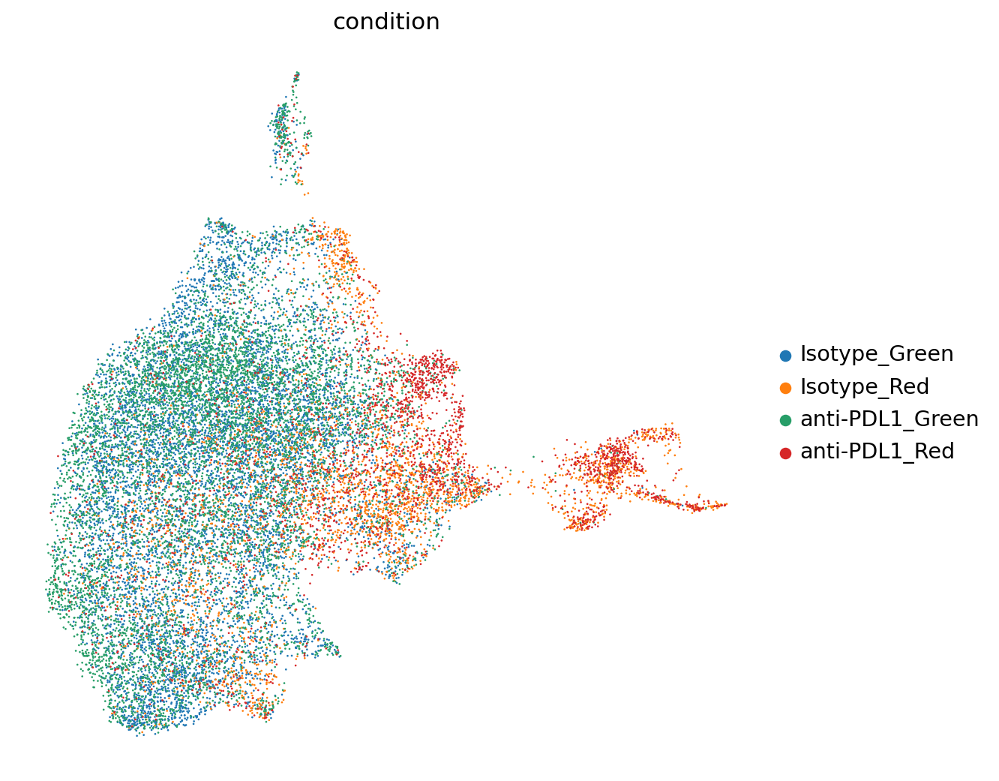

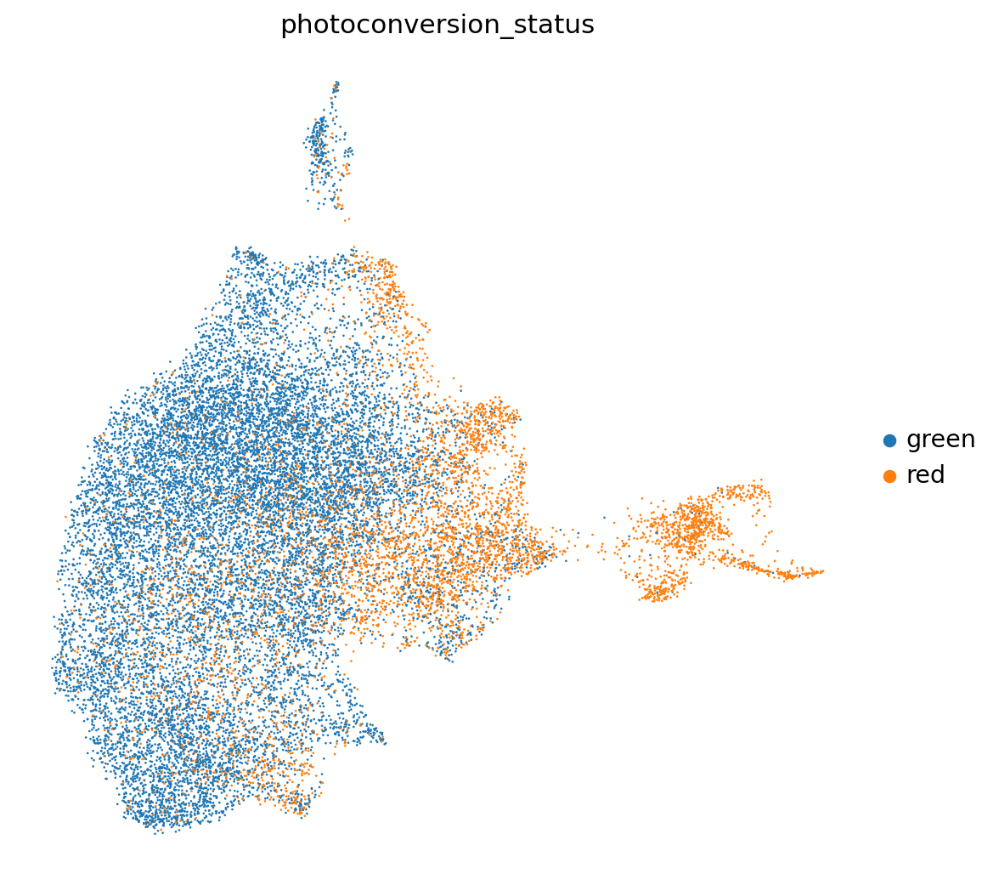

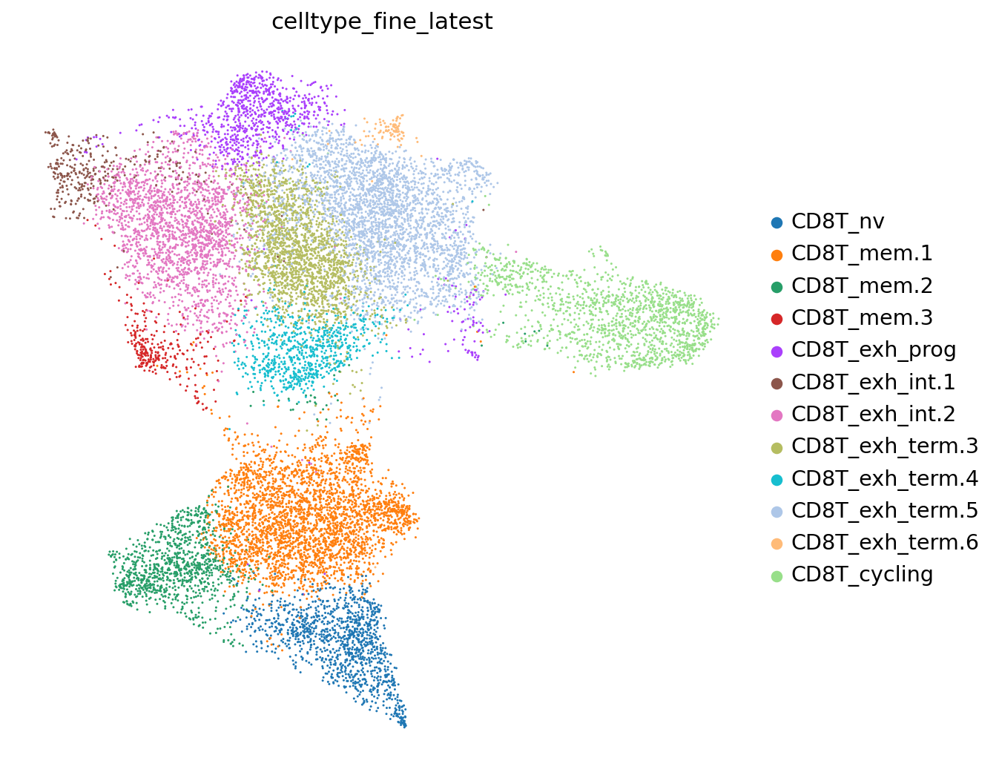

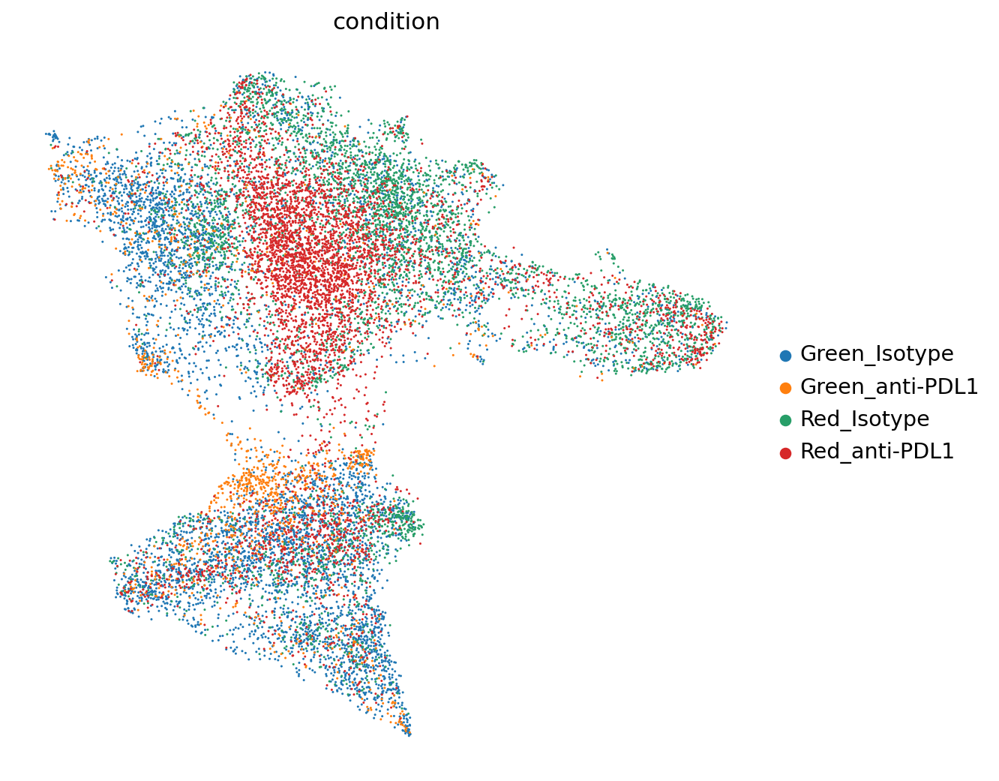

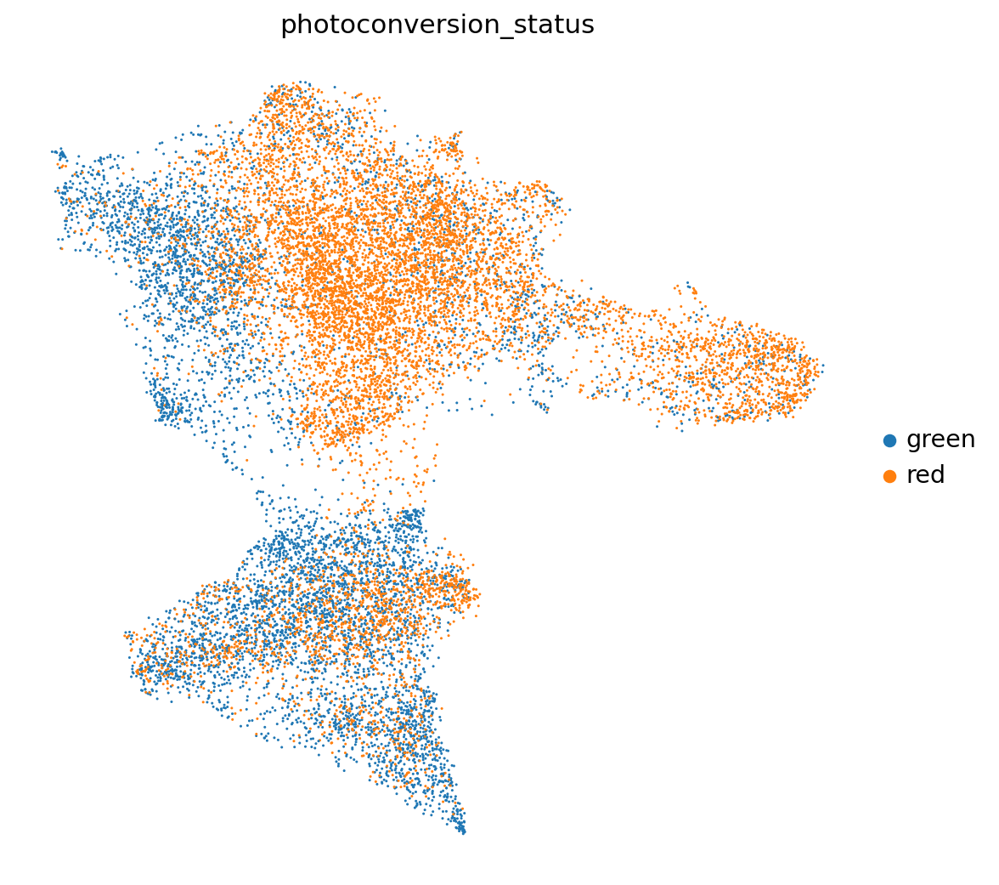

In [100]:
### GENERATES FIGURE S11B

## Plot UMAP by desired parameters

sc.pl.umap(
    adata_mac,
    color=['celltype_paper'],
    frameon=False
)

sc.pl.umap(
    adata_mac,
    color=['condition'],
    frameon=False
)

sc.pl.umap(
    adata_mac,
    color=['photoconversion_status'],
    frameon=False
)

sc.pl.umap(
    adata_cd8,
    color=['celltype_fine_latest'],
    frameon=False
)

sc.pl.umap(
    adata_cd8,
    color=['condition'],
    frameon=False
)

sc.pl.umap(
    adata_cd8,
    color=['photoconversion_status'],
    frameon=False
)

In [104]:
adata_cd8.obs['celltype_treatment'] = (
    adata_cd8.obs['celltype_fine_latest'].astype(str) + ' | ' + adata_cd8.obs['treatment'].astype(str)
)

computing score 'tls_core1_score'
    finished: added
    'tls_core1_score', score of gene set (adata.obs).
    693 total control genes are used. (0:00:00)
computing score 'tls_core2_score'
       'Man1a1', 'Naip', 'Mx1', 'Fcgr1a', 'Folr2', 'Gbp1', 'Lilrb1'],
      dtype='object')
    finished: added
    'tls_core2_score', score of gene set (adata.obs).
    1095 total control genes are used. (0:00:00)
computing score 'tls_border_score'
       'Cldn1', 'Tymp', 'Ca9', 'Nptx2', 'Cdk18', 'Enpep', 'Ifi44l', 'Apol3',
       'Lox'],
      dtype='object')
    finished: added
    'tls_border_score', score of gene set (adata.obs).
    1146 total control genes are used. (0:00:00)
computing score 'tls_border_perturbed_score'
       'Il22ra1', 'Hoxa13', 'Clic6', 'Epha7', 'Shh', 'Akr1c3', 'Fgfr4',
       'Ccl15', 'Cfap47', 'Nox4', 'Agmat', 'Vstm2l', 'Pbld', 'Aicda', 'Kcnk9',
       'Cyp3a5', 'Arx', 'Cdhr1', 'Tspan12', 'Cdhr2', 'Rgn', 'Glrb', 'Angptl3',
       'Cntn6', 'Fgfr2', 'Gpr39', 'Baat', 'Kiaa

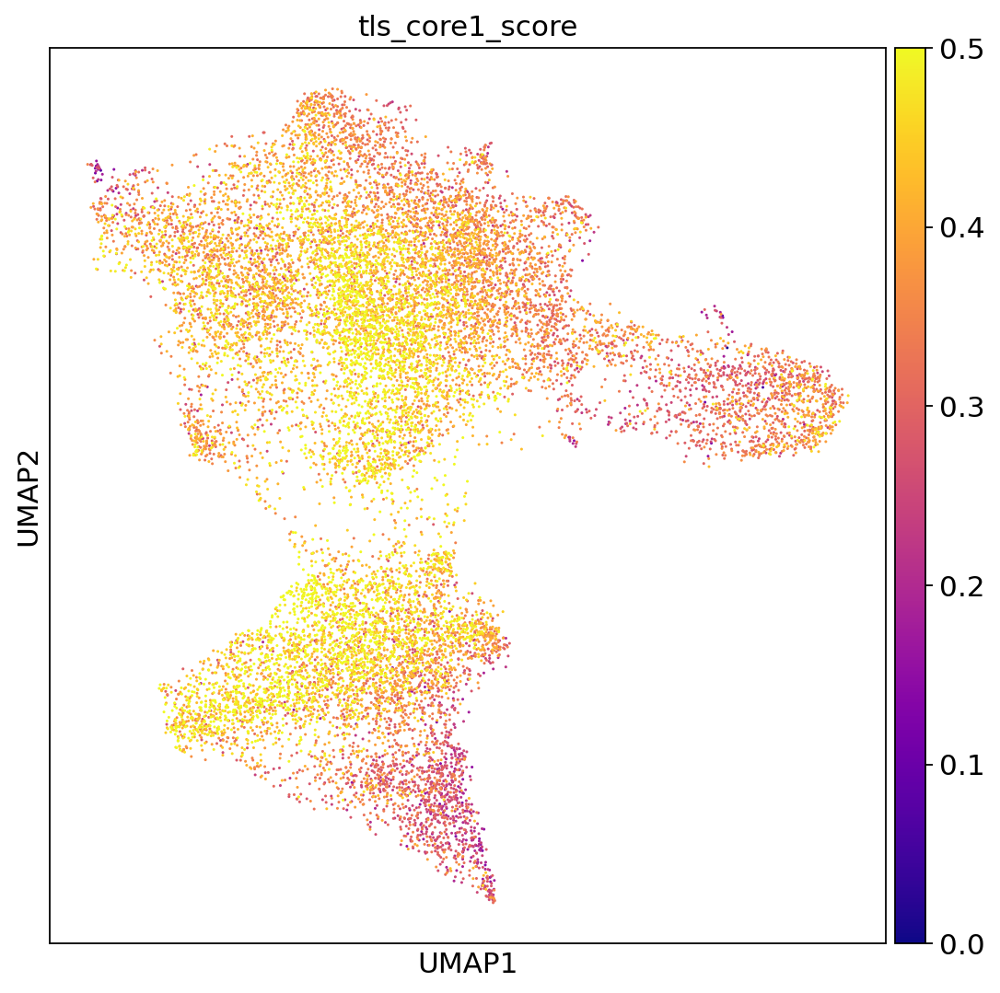

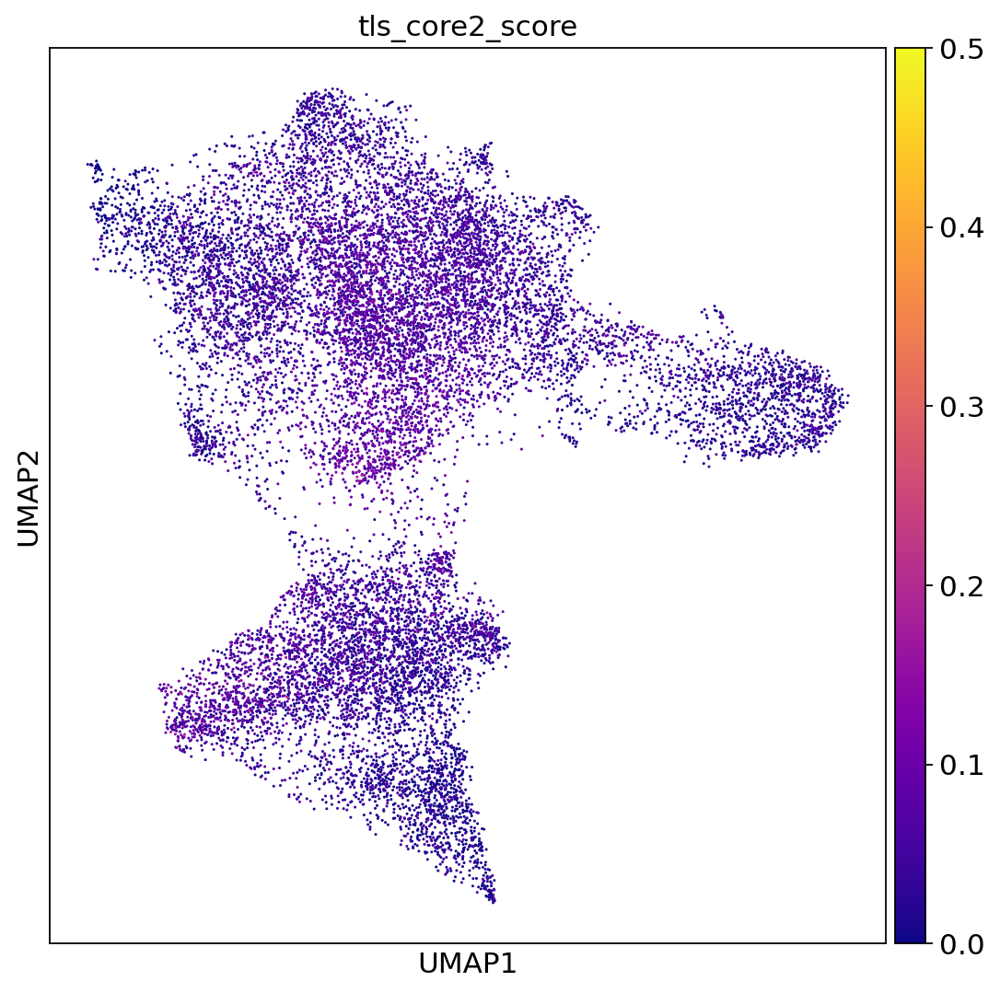

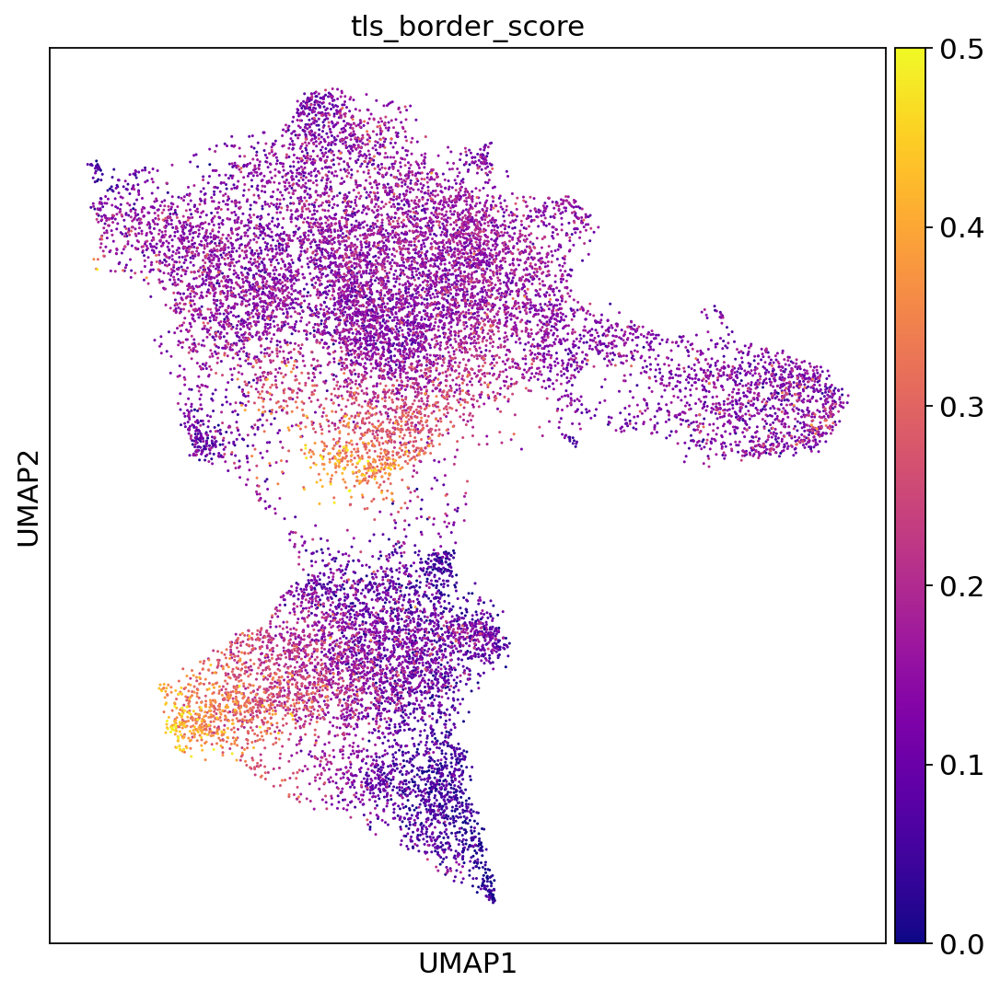

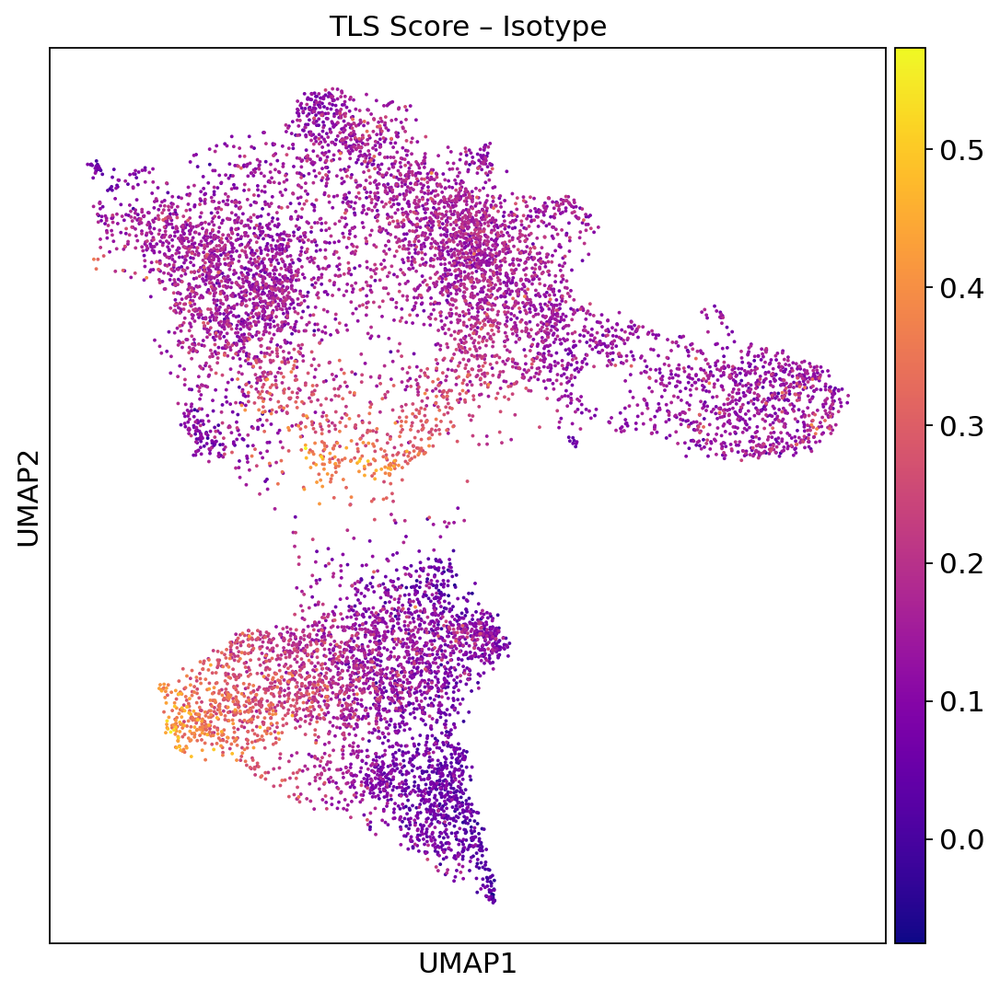

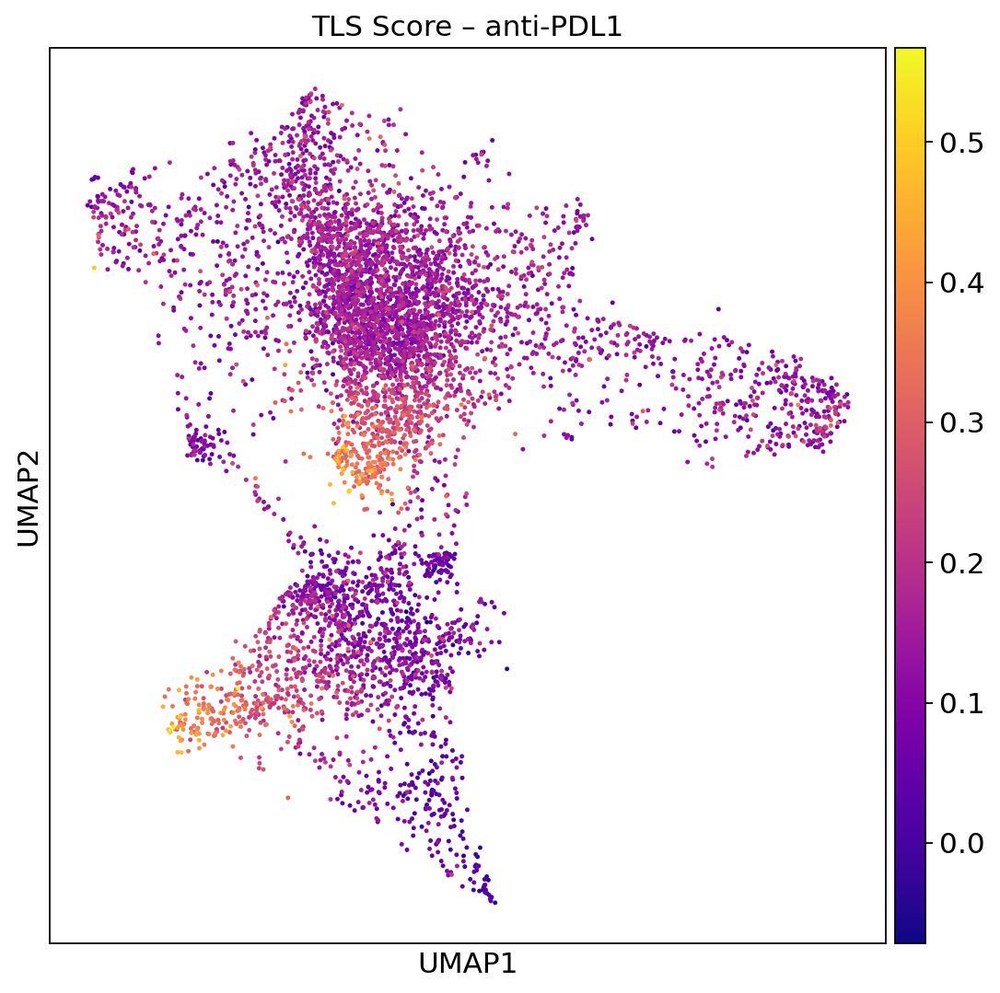

In [109]:
### GENERATES FIGURE S11C

# Define the genes
tls_core1_genes = ['Tap1', 'Il2rg', 'Cd2', 'Stat1', 'Rasgrp1', 'Gbp5', 'Cd27', 'Nlrc5', 'Cd3e',
    'Itga4', 'Cxcr3', 'Pde4dip', 'Angptl4', 'Themis', 'Ldha', 'Cd247', 'Irf1', 'Gpr174',
    'Hnrnpll', 'Ikzf3', 'Ogt', 'Gzmk', 'Spn', 'Nap1l4', 'Cd44', 'Plcg1', 'Ikzf1',
    'Itgal', 'Cd3g', 'Rassf5', 'Cd5', 'Pkm', 'Slfn5', 'Egln3', 'Btn3a1', 'Lag3',
    'Cd8a', 'Tap2', 'Zap70', 'Itgb2', 'Lck', 'Gbp1', 'Sirpg', 'Apol6', 
    'Itm2a', 'Sema4d', 'Pfkp', 'Tspan14', 'Selplg', 'Jak3', 'Adar', 'Miat',
    'Cd96', 'Ddx6', 'Chd3', 'Il10ra', 'Sdha', 'Cd6', 'Sh2d2a', 'Cyld',
    'Lat', 'Csk', 'Il16', 'Tnfrsf14', 'Itk', 'Ubash3a', 'Gzma', 'Cd82', 'Tnfrsf1b',
    'Ccr5', 'Slamf6', 'Fyn', 'Cyfip2', 'Hnrnpd', 'Oas3', 'Ptprj', 'Ndrg1',
    'Bcl11b', 'Grk2', 'Acap1', 'Lrba', 'Dnm2', 'Mdfic', 'Prkch', 'Pik3cd', 'Mbnl1',
    'Cd84', 'Hdac1', 'Dip2a', 'Plin2', 'Traf5', 'Pvt1', 'Erap1', 'Hspa8', 'Prdm1',
    'Stk4', 'Pbxip1', 'Hnrnpf']

tls_core2_genes = [
    'Cd14', 'Slco2b1', 'Msr1', 'Cd163', 'Lgmn', 'Mafb', 'Csf1r', 'Stab1', 'Siglec1', 'Cd68', 'Grn', 'Cybb',
    'Slc40a1', 'Sdc3', 'Cpvl', 'Spi1', 'Lipa', 'Ciita', 'Ap1b1', 'Creg1', 'Ncf1', 'Cd4', 'Gaa', 'Fcgr2a',
    'Ctsl', 'Ncoa4', 'Man2b1', 'Trpm2', 'Ctsc', 'Hck', 'Sgk1', 'C3ar1', 'Tymp', 'Lgals9', 'Itgax', 'Tbxas1',
    'Fmn1', 'Cxcl16', 'Trem2', 'Lair1', 'Pfkfb3', 'St14', 'Themis2', 'Cyp27a1', 'Vsig4', 'Cd84', 'Scpep1',
    'Gas6', 'Gpr34', 'Lag3', 'Fcgr3a', 'Cmklr1', 'Kcnma1', 'Cyba', 'Slc7a7', 'Man1a1', 'Arrb2', 'Abca1',
    'Dapk1', 'Wars', 'Csf3r', 'Axl', 'Naip', 'Itgb2', 'Cebpa', 'Tkt', 'Mx1', 'Plaur', 'Stat1', 'Hmox1',
    'Fcgr1a', 'Ctsh', 'Soat1', 'Folr2', 'Fermt3', 'Grb2', 'F13a1', 'Mrc2', 'Tlr4', 'Il10ra', 'Acp5',
    'Blvra', 'Ncf2', 'Gbp1', 'Ccr1', 'Plekhm2', 'Ucp2', 'Pgd', 'Lilrb1', 'Fuca1', 'Gbp5', 'Tnfsf13',
    'Cd38', 'Lamp1', 'Slamf8', 'Rassf4', 'Ifngr1', 'Hexa', 'Mrc1', 'Lta4h'
]

tls_border_genes = [
    'Apol1', 'Ubd', 'Cxcl9', 'Apol2', 'Wars', 'Gbp1', 'Serpine1', 'Tgm2', 'Rrad', 'Ifit3', 'Enpp3', 'Vcam1',
    'Cxcl10', 'Icam1', 'Cxcl11', 'Angptl4', 'Irf1', 'Oas1', 'Itga3', 'Tap1', 'Ca12', 'Ifit2', 'Tnfsf10',
    'Apol6', 'Cx3cl1', 'Mx1', 'Oas3', 'Cfb', 'C4b', 'Gbp5', 'C4a', 'Ifi35', 'Stat1', 'Cldn1', 'Tymp',
    'Egln3', 'Ca9', 'Cp', 'Nptx2', 'Met', 'Cd70', 'Tfpi2', 'Hspb8', 'Ifitm1', 'Egfr', 'Ldha', 'Axl',
    'Ifit1', 'Adm', 'Slc37a4', 'Nfe2l3', 'Spats2l', 'Cdk18', 'Pfkp', 'Cdh6', 'Trim47', 'Cdkn1a', 'Enpep',
    'Lag3', 'Cd40', 'Nfe2l1', 'Stat2', 'Ifi44l', 'Slc5a3', 'Anxa5', 'Rnf128', 'Top1', 'Plin2', 'Anpep',
    'Bcl2l1', 'Trafd1', 'Anxa2', 'Cd8a', 'Plxnb2', 'Vegfa', 'Ptprf', 'Slc16a4', 'Sdc4', 'Tnfrsf21',
    'Trim21', 'Ccnd1', 'Slc2a1', 'Plscr1', 'Eif5a', 'Acly', 'Tap2', 'Socs3', 'Pdia3', 'Herc6', 'Pml',
    'Scin', 'Dpp4', 'Gsto1', 'Ddx58', 'Tnip1', 'Apol3', 'Lox', 'Sez6l2', 'Flnb', 'Rsad2'
]

tls_border_perturbed_genes = [
    'Apob', 'F2rl1', 'Masp1', 'Prom1', 'Amacr', 'Ugt2b7', 'Kiss1r', 'Hnf4a', 'Apln', 'Abcc6', 'Ripk4',
    'Hhla2', 'Slc2a2', 'Depdc7', 'Ggt1', 'Birc7', 'Il22ra1', 'Serpinf2', 'Creg2', 'Gda', 'Cdh2', 'Hoxa13',
    'Clic6', 'Epha7', 'Kcnj16', 'Dsg2', 'Pam', 'Shh', 'Slc9a3r1', 'F2', 'Tmem106b', 'Akr1c3', 'Apom',
    'Myo5b', 'Fgfr4', 'Gcnt2', 'Tfpi2', 'Mlxipl', 'Trib3', 'Ccl15', 'Cfap47', 'Tpmt', 'Nox4', 'Wwc1',
    'Agmat', 'Aox1', 'Vstm2l', 'Dmkn', 'Pbld', 'Gprc5c', 'Mme', 'Aicda', 'Tgfa', 'Kcnk9', 'Cyp3a5',
    'Mapt', 'Arx', 'Cdhr1', 'Epcam', 'Cadm4', 'Tspan12', 'Bdkrb2', 'Cdhr2', 'Siae', 'Strip2', 'Rgn',
    'Glrb', 'Angptl3', 'Foxp2', 'Cmya5', 'Hnf1b', 'Cntn6', 'Fgfr2', 'Cdcp1', 'Gipc2', 'Gpr39', 'Baat',
    'Cdca2', 'Slc22a4', 'Nedd4l', 'Tph1', 'Hsd17b2', 'Lamp2', 'Kiaa1191', 'Ppp2r3a', 'Ugt1a4', 'Abhd6',
    'Calcr', 'Mgam', 'Emx2', 'Slc37a4', 'Havcr1', 'Slc35e1', 'Tinag', 'Havcr2', 'Slc1a1', 'Cubn', 'Pck1',
    'Habp2', 'Spag17'
]

sc.tl.score_genes(
    adata_cd8,
    gene_list=tls_core1_genes,
    score_name='tls_core1_score',
    use_raw=False  # Set to False if you're not using .raw
)

sc.tl.score_genes(
    adata_cd8,
    gene_list=tls_core2_genes,
    score_name='tls_core2_score',
    use_raw=False  # Set to False if you're not using .raw
)

sc.tl.score_genes(
    adata_cd8,
    gene_list=tls_border_genes,
    score_name='tls_border_score',
    use_raw=False  # Set to False if you're not using .raw
)

sc.tl.score_genes(
    adata_cd8,
    gene_list=tls_border_perturbed_genes,
    score_name='tls_border_perturbed_score',
    use_raw=False  # Set to False if you're not using .raw
)

sc.pl.umap(adata_cd8, color='tls_core1_score', color_map='plasma', vmin=0, vmax=0.5)
sc.pl.umap(adata_cd8, color='tls_core2_score', color_map='plasma', vmin=0, vmax=0.5)
sc.pl.umap(adata_cd8, color='tls_border_score', color_map='plasma', vmin=0, vmax=0.5)

for treatment in adata_mac.obs['treatment'].unique():
    sc.pl.umap(
        adata_cd8[adata_cd8.obs['treatment'] == treatment],
        color='tls_border_score',
        color_map='plasma',
        title=f'TLS Score – {treatment}'
    )

In [126]:
selected_celltypes = ['CD8T_mem.2', 'CD8T_exh_term.4']
adata_cd8_tls = adata_cd8[adata_cd8.obs['celltype_fine_latest'].isin(selected_celltypes)].copy()
print(adata_cd8_tls)

AnnData object with n_obs × n_vars = 1805 × 18399
    obs: 'sample', 'treatment', 'colour', 'sort_group', 'scrublet_score', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'S_score', 'G2M_score', 'phase', 'condition', 'seq_batch', 'celltype_cluster_fine', 'celltype_fine_latest', 'photoconversion_status', 'celltype_treatment', 'tls_core1_score', 'tls_core2_score', 'tls_border_score', 'tls_border_perturbed_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_fine_latest_colors', 'condition_colors', 'photoconversion_status_colors'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'


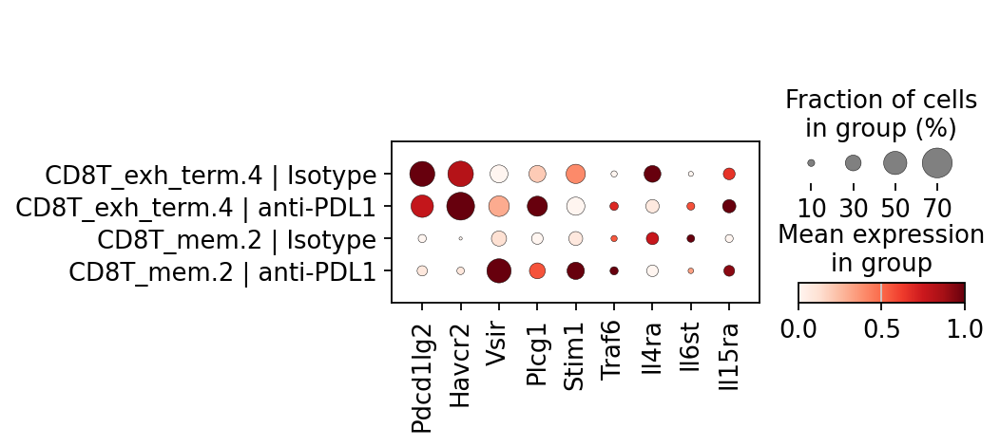

/nfs/users/nfs_d/dj17/Daniyal_training/DJ_VENV/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: FutureWarning: `scale` is deprecated, use `density_norm` instead
  return fn(*args_all, **kw)


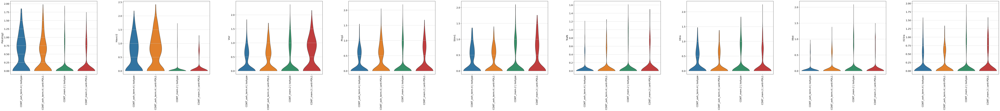

In [127]:
pertubation_genes = ["Pdcd1lg2", "Havcr2", "Vsir", "Plcg1", "Stim1", "Traf6", "Il4ra", "Il6st", "Il15ra"]

sc.pl.dotplot(
    adata_cd8_tls,
    var_names=pertubation_genes,
    groupby='celltype_treatment',
    standard_scale='var',
    color_map='Reds')

sc.pl.violin(
    adata_cd8_tls,
    keys=pertubation_genes,                 # List of genes to plot
    groupby='celltype_treatment',           # Grouping by cell type and treatment
    stripplot=False,                        # Turn off individual points
    jitter=False,                           # Disable jitter to keep plots clean
    rotation=90,                            # Rotate x-axis labels for readability
    multi_panel=True,                       # Plot each gene in a separate panel
    size=1.5,                               # Adjust size of violins
    scale='width'                           # Scale violins to same width
)

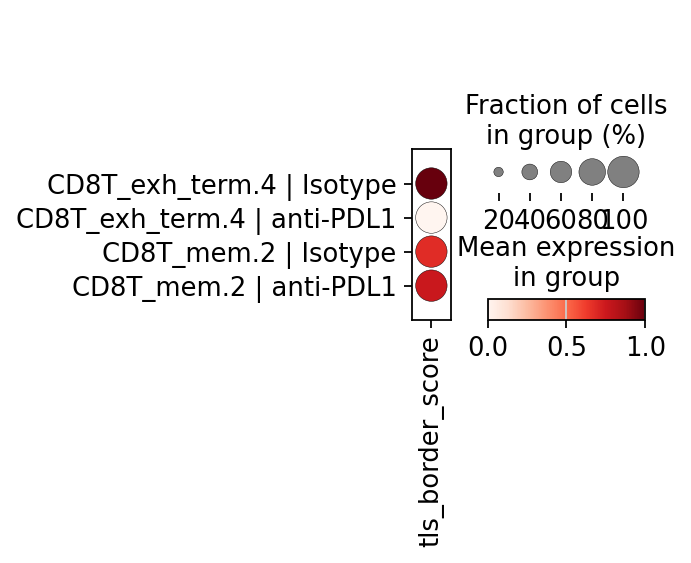

In [128]:
### GENERATES FIGURE S11C

sc.pl.dotplot(
    adata_cd8_tls,
    var_names=['tls_border_score'],
    groupby='celltype_treatment',
    standard_scale='var',
    color_map='Reds'
)

In [131]:
#selected_celltypes = ['CD8T_exh_term.4']
#adata_cd8_tls_exh = adata_cd8_tls[adata_cd8_tls.obs['celltype_fine_latest'].isin(selected_celltypes)].copy()
#print(adata_cd8_tls_exh)

AnnData object with n_obs × n_vars = 778 × 18399
    obs: 'sample', 'treatment', 'colour', 'sort_group', 'scrublet_score', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'gmm_pct_count_clusters_keep', 'is_doublet', 'filter_rna', 'batch', 'S_score', 'G2M_score', 'phase', 'condition', 'seq_batch', 'celltype_cluster_fine', 'celltype_fine_latest', 'photoconversion_status', 'celltype_treatment', 'tls_core1_score', 'tls_core2_score', 'tls_border_score', 'tls_border_perturbed_score', 'celltype_photoconv'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_fine_latest_colors', 'condition_colors', 'photoconversion_status_colors', 'celltype_treatment_colors', 'celltype_photoconv_colors'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'


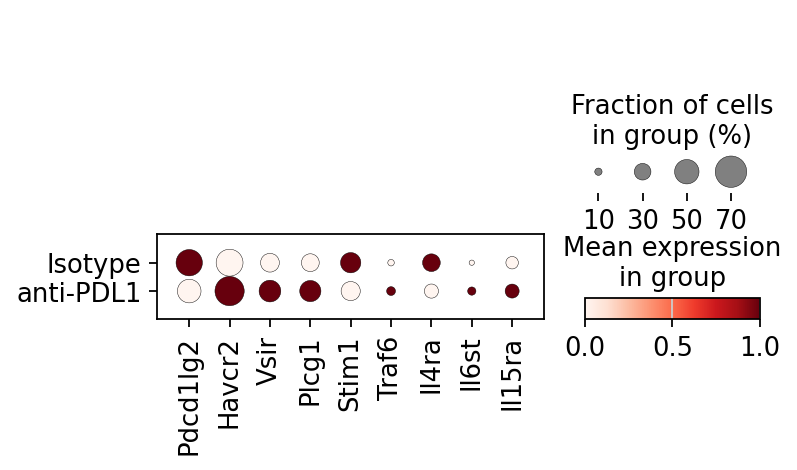

/nfs/users/nfs_d/dj17/Daniyal_training/DJ_VENV/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: FutureWarning: `scale` is deprecated, use `density_norm` instead
  return fn(*args_all, **kw)


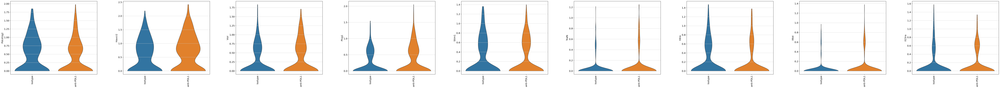

In [133]:
pertubation_genes = ["Pdcd1lg2", "Havcr2", "Vsir", "Plcg1", "Stim1", "Traf6", "Il4ra", "Il6st", "Il15ra"]

sc.pl.dotplot(
    adata_cd8_tls_exh,
    var_names=pertubation_genes,
    groupby='treatment',
    standard_scale='var',
    color_map='Reds')

sc.pl.violin(
    adata_cd8_tls_exh,
    keys=pertubation_genes,                 # List of genes to plot
    groupby='treatment',           # Grouping by cell type and treatment
    stripplot=False,                        # Turn off individual points
    jitter=False,                           # Disable jitter to keep plots clean
    rotation=90,                            # Rotate x-axis labels for readability
    multi_panel=True,                       # Plot each gene in a separate panel
    size=1.5,                               # Adjust size of violins
    scale='width'                           # Scale violins to same width
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


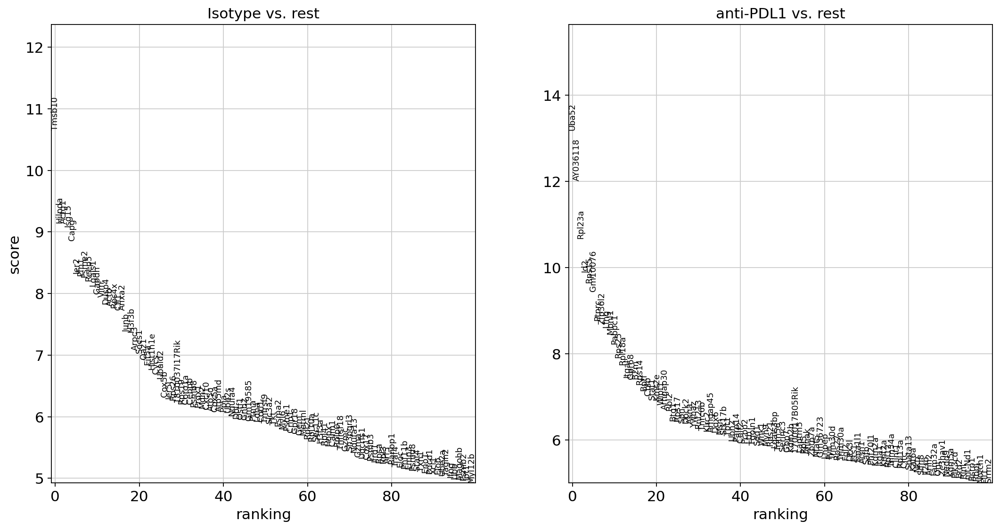

Top genes in Isotype:
['Tmsb10' 'Hilpda' 'Actg1' 'Isg15' 'Capg' 'Ier2' 'Pfn1' 'Psme2' 'Reep5'
 'Lgals1' 'Gapdh' 'Vim' 'Dusp4' 'Actb' 'Rps4x' 'Cfl1' 'Anxa2' 'Junb'
 'H3f3b' 'Arpc3' 'Socs1' 'Oaz1' 'Eif5a' 'Hist1h1e' 'Cycs' 'Ubald2' 'Cox5b'
 'Ier5l' 'Rps26' '1810037I17Rik' 'Rps19' 'Coro1a' 'Cebpb' 'Psmb8' 'Prdx1'
 'Mdh2' 'Cxcl10' 'Atp5o' 'Cox5a' 'Atp5md' 'Ppia' 'Ube2s' 'Ndufa4' 'Dbi'
 'Ostf1' 'Gnb2' 'Gm19585' 'Ptma' 'Ldha' 'Cotl1' 'Tnfrsf9' 'Slc3a2' 'Tkt'
 'Psma2' 'Myl6' 'Psme1' 'Crip1' 'Gpr18' 'Gem' 'Metrnl' 'Rpl21' 'Rpl10a'
 'Sec11c' 'H3f3a' 'Rpl41' 'Hopx' 'Calm1' 'Rplp0' 'Tnfrsf18' 'Gzmc'
 'Sh3bgrl3' 'Ndufa13' 'Gzma' 'Uqcrfs1' 'Cox17' 'Psmb3' 'Ifrd1' 'Rpsa'
 'Rpl3' 'Arf5' 'Ranbp1' 'Traf4' 'Eloc' 'Phf11b' 'Emp3' 'Psmd8' 'Stat4'
 'Txn1' 'Eno1' 'Pdcd1' 'Xcl1' 'Elob' 'Ube2a' 'Tagln2' 'Ifng' 'Ubb'
 'Magohb' 'Psmb2' 'Jpt1' 'Myl12b']
Top genes in anti-PDL1:
['Uba52' 'AY036118' 'Rpl23a' 'Id2' 'Rps15' 'Gm10076' 'Ptprc' 'Zfp36l2'
 'Lfng' 'Mbnl1' 'Pabpc1' 'Rps25' 'Rpl18a' 'Itgal' 'Gpr68' 'B2m' 'R

In [144]:
sc.tl.rank_genes_groups(
    adata_cd8_tls_exh,
    groupby='treatment',  # could also be 'treatment'
    method='wilcoxon',                 # or 't-test', 'logreg'
    use_raw=False                       # or False if not using .raw
)

# Now run the differential expression analysis using these counts
sc.tl.rank_genes_groups(adata_cd8_tls_exh, groupby='treatment', method='wilcoxon')
sc.pl.rank_genes_groups(adata_cd8_tls_exh, n_genes=100, sharey=False)

# Optionally, view the top genes per cluster
result = adata_cd8_tls_exh.uns['rank_genes_groups']
groups = result['names'].dtype.names  # cluster names
for group in groups:
    print(f"Top genes in {group}:")
    print(result['names'][group][:100])


/nfs/users/nfs_d/dj17/Daniyal_training/DJ_VENV/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:82: FutureWarning: `scale` is deprecated, use `density_norm` instead
  return fn(*args_all, **kw)


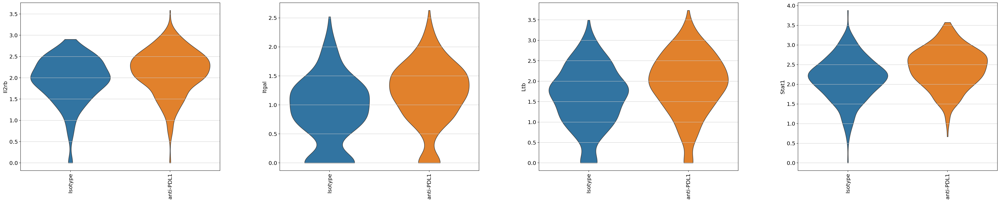

In [147]:
### GENERATES FIGURE S11D

sc.pl.violin(
    adata_cd8_tls_exh,
    keys=['Il2rb', 'Itgal', 'Ltb', 'Stat1'],   # Correctly formatted list of genes
    groupby='treatment',
    stripplot=False,
    jitter=False,
    rotation=90,
    multi_panel=True,
    size=1.5,
    scale='width')